In [1]:
# importing the required libraries and setting the figure size 

import os
import tensorflow as tf
import IPython.display as display
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.image as mpimg
import numpy as np
import PIL.Image
import functools



mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

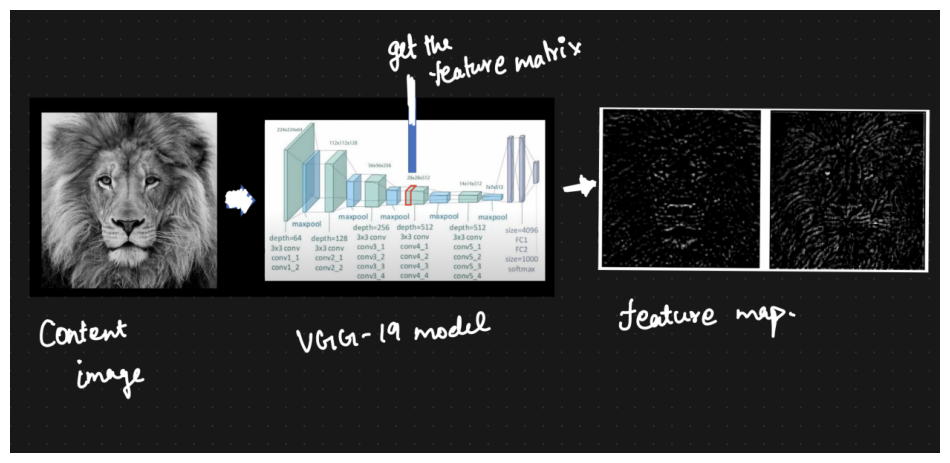

In [2]:
def display_image(image_path, title, subplot_position=None):
    img = mpimg.imread(image_path)
    if subplot_position:
        plt.subplot(subplot_position[0], subplot_position[1], subplot_position[2])
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')

display_image(r"/kaggle/input/assets/slides/1.png","")
plt.show()

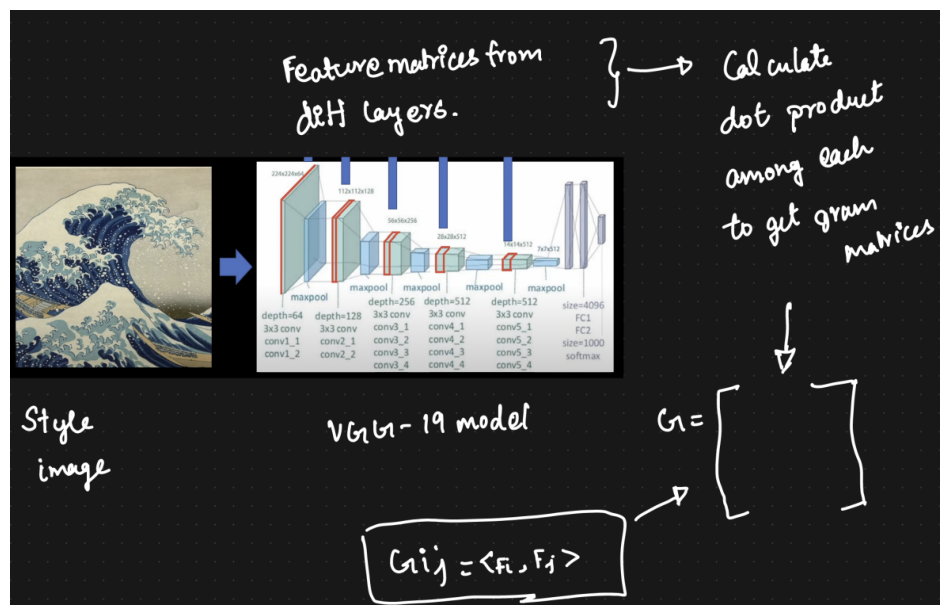

In [3]:
display_image(r"/kaggle/input/assets/slides/2.png","")
plt.show()

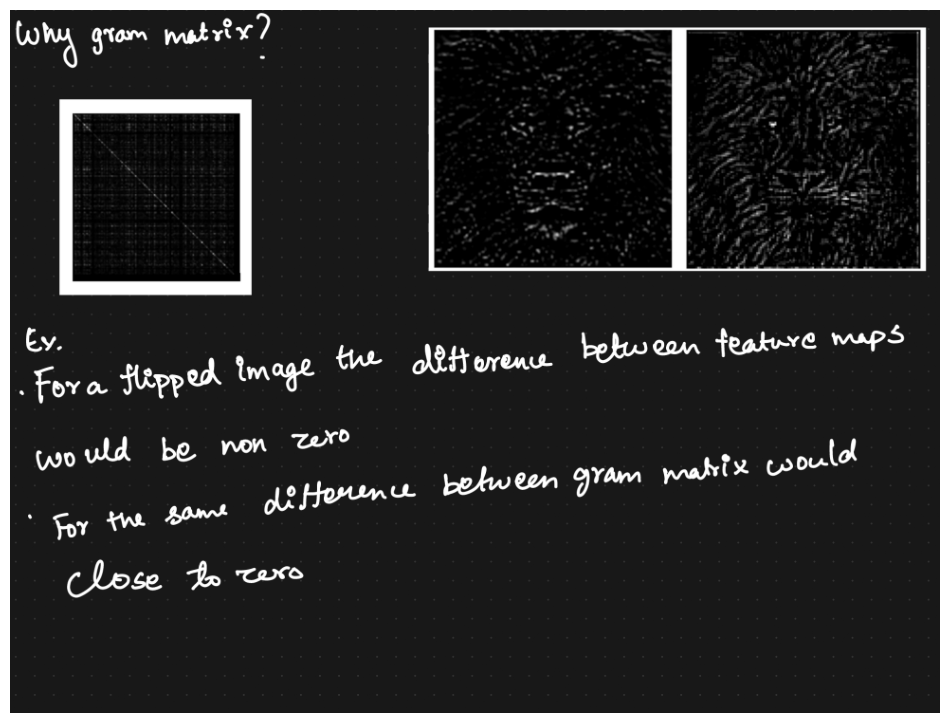

In [4]:
display_image(r"/kaggle/input/assets/slides/3.png","")
plt.show()

In [5]:
# function to convert tensor to image

def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

# function to load image

def load_img(path_to_img):
  max_dim = 512 
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  shape = (tf.shape(img)[0],tf.shape(img)[1])
  shape = tf.cast(shape, tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim
  new_shape = tf.cast(shape * scale, tf.int32)
  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img



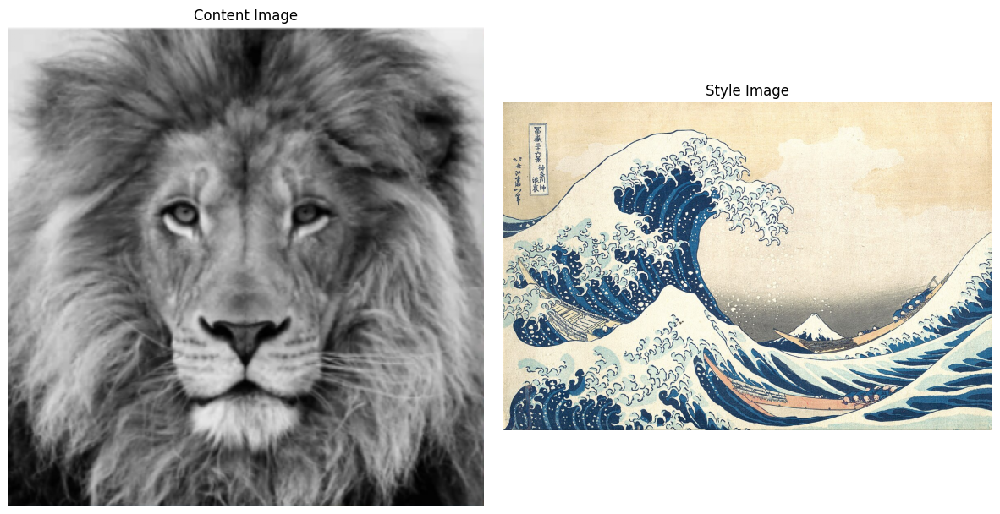

In [6]:
content_path = "/kaggle/input/assets/content_practice.png"
style_path = "/kaggle/input/assets/style_practice.jpg"

content_image = load_img(content_path)
style_image = load_img(style_path)

content_image_display = tensor_to_image(content_image)
style_image_display = tensor_to_image(style_image)


plt.figure(figsize=(12, 6))

display_image(content_path, "Content Image", subplot_position=(1, 2, 1))
display_image(style_path, "Style Image", subplot_position=(1, 2, 2))

plt.tight_layout()
plt.show()


In [7]:
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')

content_layers = ['block5_conv2'] 

style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [8]:
def vgg_layers(layer_names):
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  outputs = [vgg.get_layer(name).output for name in layer_names]
  model = tf.keras.Model([vgg.input], outputs)
  return model


style_extractor = vgg_layers(style_layers)
style_outputs = style_extractor(style_image*255)

In [9]:
# function to get the gram matrix from the feature maps
# i and j represent spatial dimension or height and width
# c and d represent feature maps
def gram_matrix(input_tensor):
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
  return result/(num_locations)

# function to extract the content representation or the feature maps 
# also to extract the style representation or the gram matrix

def extract_style_content_features(content_image, style_layers, content_layers, vgg_model):
    vgg = vgg_model
    inputs = content_image * 255.0 
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    outputs = vgg(preprocessed_input)
    style_outputs, content_outputs = outputs[:len(style_layers)], outputs[len(style_layers):]
    style_outputs = [gram_matrix(style_output) for style_output in style_outputs]
    content_dict = {content_name: value
                    for content_name, value
                    in zip(content_layers, content_outputs)}
    style_dict = {style_name: value
                  for style_name, value
                  in zip(style_layers, style_outputs)}
    return {'content': content_dict, 'style': style_dict}

# function to normalize the value in the range 0 to 1

def clip_0_1(image):
  return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)


In [10]:
# get the vgg_model
vgg_model = vgg_layers(style_layers + content_layers)
vgg_model.trainable = False

results = extract_style_content_features(content_image, style_layers, content_layers, vgg_model)

# store them respectively
style_targets = extract_style_content_features(style_image, style_layers, content_layers, vgg_model)['style']
content_targets = extract_style_content_features(content_image, style_layers, content_layers, vgg_model)['content']


In [11]:
image = tf.Variable(content_image)

opt = tf.keras.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

style_weight=1e-2
content_weight=1e4

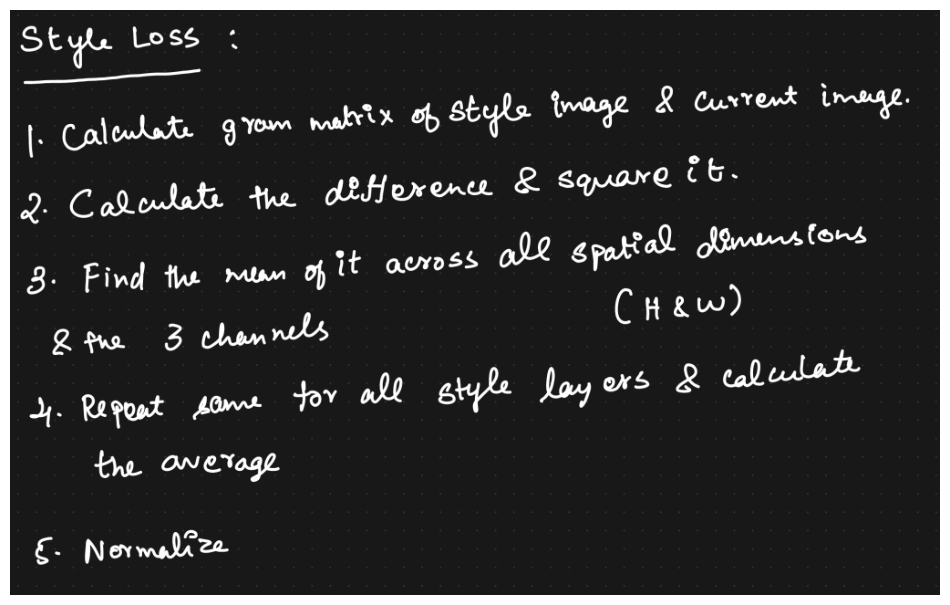

In [12]:
display_image(r"/kaggle/input/assets/slides/style_loss.png","")
plt.show()

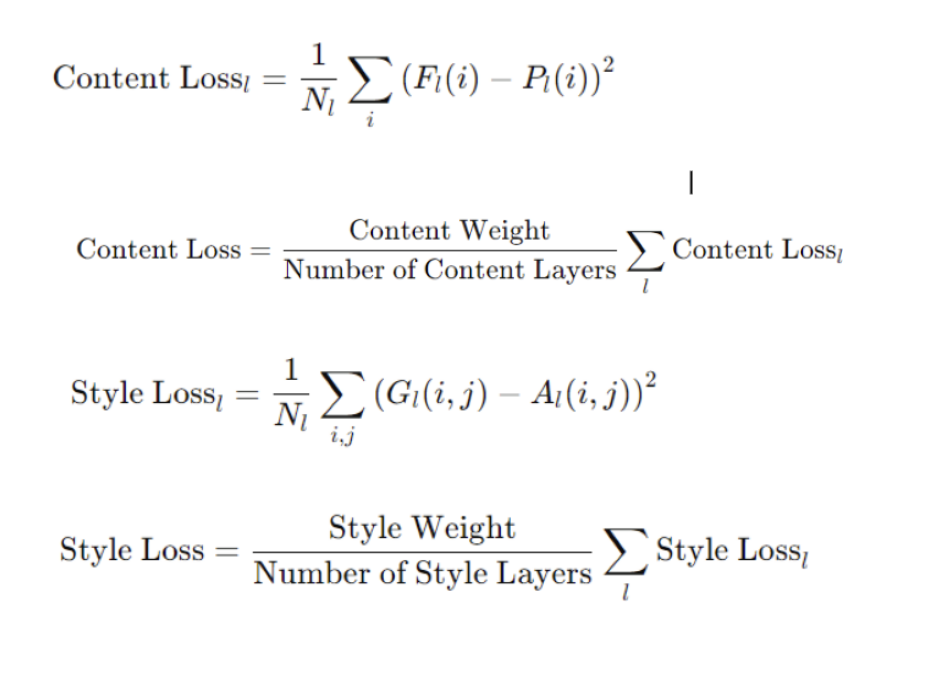

In [13]:
display_image(r"/kaggle/input/assets/losses_formula.png","")
plt.show()

In [14]:
# function to calculate style loss and content loss and return the total loss

def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    style_loss *= style_weight / num_style_layers

    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss



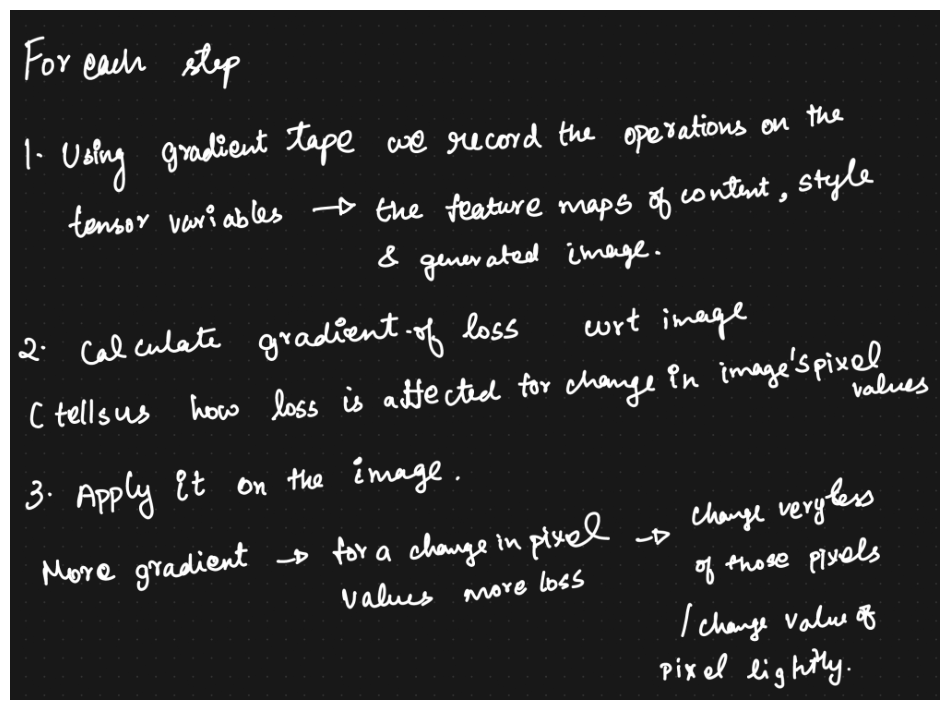

In [15]:
display_image(r"/kaggle/input/assets/slides/each step.png","")
plt.show()

In [16]:
# function for each step 

@tf.function
def train_step(image, vgg_model):
    with tf.GradientTape() as tape:
        outputs = extract_style_content_features(image, style_layers, content_layers, vgg_model)
        loss = style_content_loss(outputs)
    grad = tape.gradient(loss, image)
    opt.apply_gradients([(grad, image)])
    image.assign(clip_0_1(image))

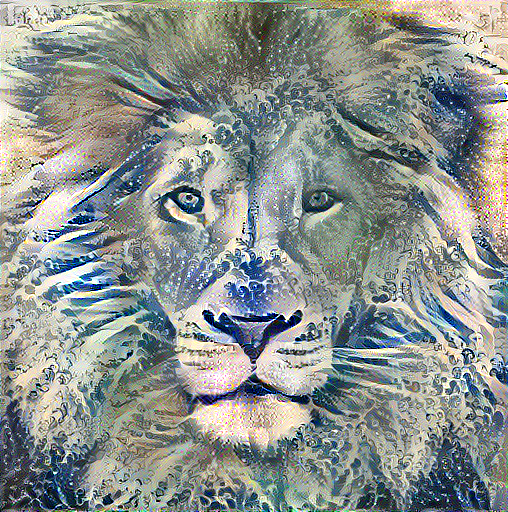

Train step: 1000


In [17]:
epochs = 10
steps_per_epoch = 100

step = 0
for n in range(epochs):
  for m in range(steps_per_epoch):
    step += 1
    train_step(image,vgg_model)
  display.clear_output(wait=True)
  display.display(tensor_to_image(image))
  print("Train step: {}".format(step))

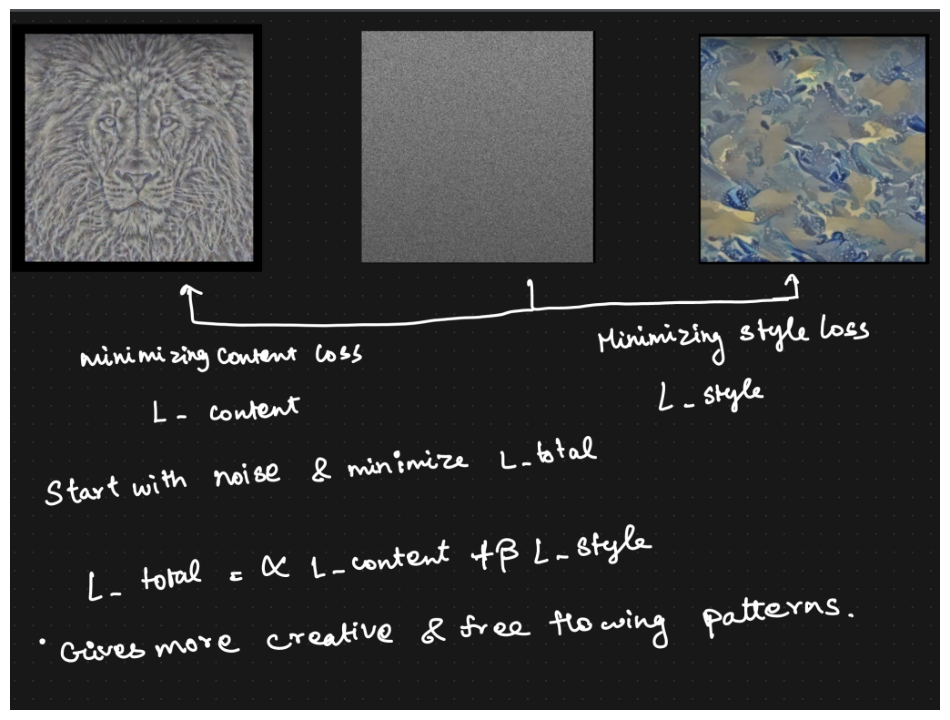

In [18]:
display_image(r"/kaggle/input/assets/slides/paper.png","")
plt.show()

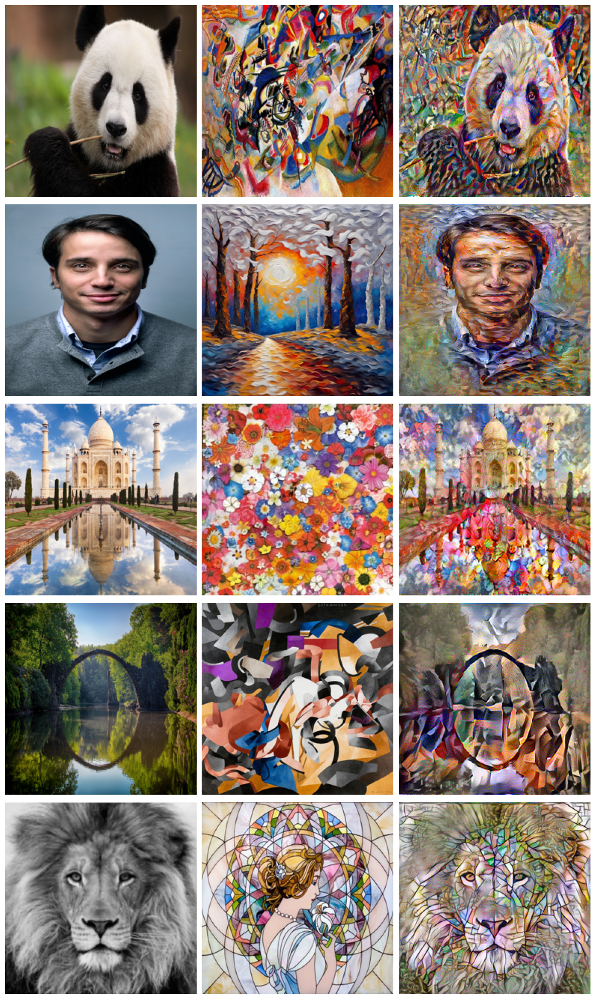

In [19]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def load_and_resize_image(image_path, size=(256, 256)):
    img = Image.open(image_path)
    return img.resize(size)

base_path = "/kaggle/input/assets"

fig, axes = plt.subplots(5, 3, figsize=(12, 20))  
row = 0

for i in range(1, 6):
    content_path = f"{base_path}/content/content_{i}.png" if os.path.exists(f"{base_path}/content/content_{i}.png") else f"{base_path}/content/content_{i}.jpg"
    style_path = f"{base_path}/style/style_{i}.png" if os.path.exists(f"{base_path}/style/style_{i}.png") else f"{base_path}/style/style_{i}.jpg"
    final_path = f"{base_path}/examples/final_{i}.png"

    if not os.path.exists(content_path):
        print(f"Skipping content_{i} as it is missing.")
        continue

    content_image = load_and_resize_image(content_path)
    style_image = load_and_resize_image(style_path)
    final_image = load_and_resize_image(final_path)

    axes[row, 0].imshow(content_image)
    axes[row, 0].axis('off')

    axes[row, 1].imshow(style_image)
    axes[row, 1].axis('off')

    axes[row, 2].imshow(final_image)
    axes[row, 2].axis('off')

    row += 1

plt.tight_layout()
plt.show()


Original Paper Link:
https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf

A great Explanation video:
https://www.youtube.com/watch?v=B22nIUhXo4E&list=PLBoQnSflObcmbfshq9oNs41vODgXG-608&index=2

Tensorflow docs:
https://www.tensorflow.org/tutorials/generative/style_transfer